In [1]:
import numpy as np
import pandas as pd

from sklearn import datasets
# sklearn.neighborsモジュールのk-NNメソッド
from sklearn.neighbors import KNeighborsClassifier
# sklearnのデータ分割ユーティリティ
from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt
# カラーマップを生成するメソッド
from matplotlib.colors import ListedColormap

# matplotlibの日本語表示モジュール
!pip install japanize-matplotlib
import japanize_matplotlib

     |████████████████████████████████| 4.1 MB 828 kB/s 
  Created wheel for japanize-matplotlib: filename=japanize_matplotlib-1.1.3-py3-none-any.whl size=4120274 sha256=6692b8ecf1e6e0c8f7c291232932053352aac8b4c88d7c761116223d740dc96f
  Stored in directory: /Users/nmatsumoto/Library/Caches/pip/wheels/4f/ca/96/4cc5e192421cceb077fbf4ffec533382edd416fd3fa0af0bbd
Successfully built japanize-matplotlib


In [2]:
iris = datasets.load_iris()

In [4]:
# 説明変数（特徴量）
print("ラベル：\n", iris.feature_names)
print("形状：\n", iris.data.shape)
print("先頭10行：\n", iris.data[0:10, :]) 

# 目的変数（種類）
print("ラベル：\n", iris.target_names)
print("形状：\n", iris.target.shape)
print("全表示：\n", iris.target)

ラベル：
 ['sepal length (cm)', 'sepal width (cm)', 'petal length (cm)', 'petal width (cm)']
形状：
 (150, 4)
先頭10行：
 [[5.1 3.5 1.4 0.2]
 [4.9 3.  1.4 0.2]
 [4.7 3.2 1.3 0.2]
 [4.6 3.1 1.5 0.2]
 [5.  3.6 1.4 0.2]
 [5.4 3.9 1.7 0.4]
 [4.6 3.4 1.4 0.3]
 [5.  3.4 1.5 0.2]
 [4.4 2.9 1.4 0.2]
 [4.9 3.1 1.5 0.1]]
ラベル：
 ['setosa' 'versicolor' 'virginica']
形状：
 (150,)
全表示：
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2]


In [5]:
X_train, X_test, y_train, y_test = train_test_split(
    iris.data, 
    iris.target,
    stratify = iris.target, # 層化サンプリング
    random_state = 0)

In [6]:
print("形状：", y_train.shape)

# ユニークな要素ごとの個数を取得
np.unique(y_train, return_counts=True)

形状： (112,)


(array([0, 1, 2]), array([37, 37, 38]))

In [7]:
# 正解率を格納する変数
training_accuracy = []
test_accuracy = []

# kを変更しながらk-NNを実行し、正解率を取得
for k in range(3,21):
    # kを渡してインスタンスを生成し、データをfitさせてモデルを生成
    kNN = KNeighborsClassifier(n_neighbors = k)
    kNN.fit(X_train, y_train)
    # scoreで正解率を取得し、順次格納
    training_accuracy.append(kNN.score(X_train, y_train))
    test_accuracy.append(kNN.score(X_test, y_test))

# 正解率をnumpyの配列に変換
training_accuracy = np.array(training_accuracy)
test_accuracy = np.array(test_accuracy)

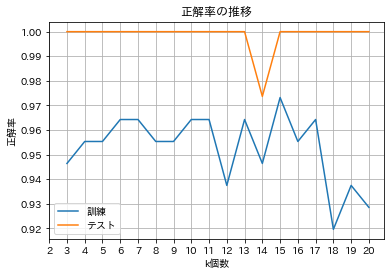

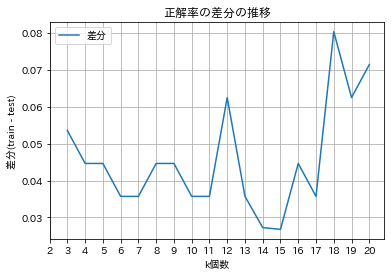

In [8]:
# 訓練用・テスト用の正解率の推移
plt.figure(figsize=(6, 4))

plt.plot(range(3,21), training_accuracy, label='訓練')
plt.plot(range(3,21), test_accuracy, label='テスト')

plt.xticks(np.arange(2, 21, 1)) # x軸目盛
plt.xlabel('k個数')
plt.ylabel('正解率')
plt.title('正解率の推移')

plt.grid()
plt.legend()

# 正解率の差分の推移
plt.figure(figsize=(6, 4))

difference = np.abs(training_accuracy - test_accuracy) # 差分を計算
plt.plot(range(3,21), difference, label='差分')

plt.xticks(np.arange(2, 21, 1)) # x軸目盛
plt.xlabel('k個数')
plt.ylabel('差分(train - test)')
plt.title('正解率の差分の推移')

plt.grid()
plt.legend()

plt.show()

In [9]:
# kの個数を指定
k = 15

# 説明変数Xと目的変数yを設定
X = iris.data[:, :2]
y = iris.target

# インスタンスを作成し、データをフィットさせてモデルを生成
model = KNeighborsClassifier(n_neighbors=k)
model.fit(X, y)

KNeighborsClassifier(n_neighbors=15)

In [10]:
# メッシュ間隔を指定
h = 0.02

# カラーマップを作成
cmap_surface = ListedColormap(['darkseagreen', 'mediumpurple', 'gold']) # 面グラフ用
cmap_dot = ListedColormap(['darkgreen', 'darkslateblue', 'olive']) # 散布図用

# x,y軸の最小値・最大値を取得
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
# 指定のメッシュ間隔で格子列を生成
xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                     np.arange(y_min, y_max, h))

# 格子列をモデルに渡して予測
Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape) # 形状変換

<ipython-input-11-378fbf83feef>:4: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(xx, yy, Z, cmap=cmap_surface)


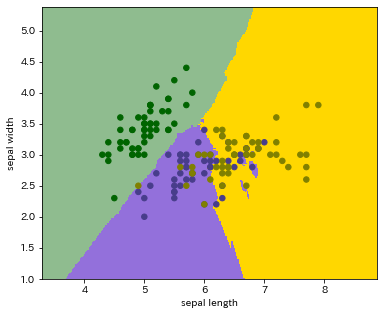

In [11]:
plt.figure(figsize=(6,5))

# 等値線図
plt.pcolormesh(xx, yy, Z, cmap=cmap_surface)
# 散布図
plt.scatter(X[:, 0], X[:, 1], c=y, cmap=cmap_dot, s=30)

plt.xlim(xx.min(), xx.max())
plt.ylim(yy.min(), yy.max())
plt.xlabel('sepal length')
plt.ylabel('sepal width')

plt.show()